![header](figures/logos.jpg)

# Copernicus Marine Sea Level Demo

<div style="text-align: right"><i> 2022-08-03 SEALEVEL_DEMO </i></div>

***
**Authors:**  M. Ballarotta <br>
**Copyright:** 2022 M. Ballarotta <br>
**License:** MIT


<div class="alert alert-block alert-success">
<h1><center>How to access CMEMS catalogue and display maps ?</center></h1></div>

***
**General Note 1**: Execute each cell through the <button class="btn btn-default btn-xs"><i class="icon-play fa fa-play"></i></button> button from the top MENU (or keyboard shortcut `Shift` + `Enter`).<br>
<br>
**General Note 2**: If, for any reason, the kernel is not working anymore, in the top MENU, click on the <button class="btn btn-default btn-xs"><i class="fa fa-repeat icon-repeat"></i></button> button. Then, in the top MENU, click on "Cell" and select "Run All Above Selected Cell".<br>
***

<div class="alert alert-danger" role="alert">

<h3>Learning outcomes</h3>

At the end of this notebook you will know:
<ul>
  <li>How you can to access Copernicus Marine SEa Level Products.</li>
  <li>How you visualse mapping products </li>
</ul>
    
</div>

In [1]:
import warnings
import os
import sys

import numpy as np
import xarray as xr
import getpass

import proplot as plot


%matplotlib inline
warnings.simplefilter("ignore")

In [2]:
sys.path.append('..')

In [3]:
from src.mod_io import *
from src.mod_plot import *

<hr>

### Create an account on Copernicus Marine Service: https://resources.marine.copernicus.eu/registration-form

### Login

In [4]:
USERNAME = 'mballarotta1'
PASSWORD = getpass.getpass('Enter your password: ')

Enter your password:  ··········


<div class="alert alert-info" role="alert">

<h2>1. Copernicus Products</h2>

</div>

We will focus on the following product (available on the [Copernicus Catalogue](http://marine.copernicus.eu/services-portfolio/access-to-products/?option=com_csw&task=results)):

| Product Description | PRODUCT IDENTIFIER | DOI | 
|:--------------------:|:-----------------------:|:-------------:|
| GLOBAL OCEAN GRIDDED L4 SEA SURFACE HEIGHTS AND DERIVED VARIABLES REPROCESSED (1993-ONGOING) | SEALEVEL_GLO_PHY_L4_MY_008_047 | [https://doi.org/10.48670/moi-00148](https://doi.org/10.48670/moi-00148) | 

### 1.1 Read DUACS-DT2021 Reanalysis Product

In [5]:
DUACS_L4_DT_DATASET_ID = 'cmems_obs-sl_glo_phy-ssh_my_allsat-l4-duacs-0.25deg_P1D'

In [6]:
data_store_duacs_dt2021 = copernicusmarine_datastore(DUACS_L4_DT_DATASET_ID, USERNAME, PASSWORD)

In [7]:
ds_duacs_dt2021 = xr.open_dataset(data_store_duacs_dt2021)
ds_duacs_dt2021

<xarray.Dataset>
Dimensions:         (latitude: 720, longitude: 1440, nv: 2, time: 10632)
Coordinates:
  * latitude        (latitude) float32 -89.88 -89.62 -89.38 ... 89.62 89.88
  * longitude       (longitude) float32 -179.9 -179.6 -179.4 ... 179.6 179.9
  * nv              (nv) int32 0 1
  * time            (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2022-02-09
Data variables: (12/14)
    crs             int32 ...
    lat_bnds        (latitude, nv) float32 ...
    lon_bnds        (longitude, nv) float32 ...
    sla             (time, latitude, longitude) float64 ...
    err_sla         (time, latitude, longitude) float64 ...
    ugosa           (time, latitude, longitude) float64 ...
    ...              ...
    err_vgosa       (time, latitude, longitude) float64 ...
    adt             (time, latitude, longitude) float64 ...
    ugos            (time, latitude, longitude) float64 ...
    vgos            (time, latitude, longitude) float64 ...
    tpa_correction  (time) float64 ...
    flag_ice        (time, latitude, longitude) float64 ...
Attributes: (12/45)
    Conventions:                     CF-1.6
    Metadata_Conventions:            Unidata Dataset Discovery v1.0
    cdm_data_type:                   Grid
    comment:                         Sea Surface Height measured by Altimetry...
    contact:                         servicedesk.cmems@mercator-ocean.eu
    creator_email:                   servicedesk.cmems@mercator-ocean.eu
    ...                              ...
    time_coverage_duration:          P1D
    time_coverage_end:               2022-02-09T12:00:00Z
    time_coverage_resolution:        P1D
    time_coverage_start:             2022-02-08T12:00:00Z
    title:                           DT merged all satellites Global Ocean Gr...
    _CoordSysBuilder:                ucar.nc2.dataset.conv.CF1Convention

<div class="alert alert-info" role="alert">

<h2>2. Visualize maps</h2>

</div>

### Define Region/time of interest

In [8]:
date_of_interest = '2017-01-01'
lon_min = -180.
lon_max = 180. 
lat_min = -90.
lat_max = 90.

In [9]:
ds_duacs_dt2021_selection = ds_duacs_dt2021.sel(longitude=slice(lon_min, lon_max), latitude=slice(lat_min, lat_max), time=[date_of_interest], drop=True)
ds_duacs_dt2021_selection

<xarray.Dataset>
Dimensions:         (latitude: 720, longitude: 1440, nv: 2, time: 1)
Coordinates:
  * latitude        (latitude) float32 -89.88 -89.62 -89.38 ... 89.62 89.88
  * longitude       (longitude) float32 -179.9 -179.6 -179.4 ... 179.6 179.9
  * nv              (nv) int32 0 1
  * time            (time) datetime64[ns] 2017-01-01
Data variables: (12/14)
    crs             int32 -2147483647
    lat_bnds        (latitude, nv) float32 -90.0 -89.75 -89.75 ... 89.75 90.0
    lon_bnds        (longitude, nv) float32 -180.0 -179.8 -179.8 ... 179.8 180.0
    sla             (time, latitude, longitude) float64 ...
    err_sla         (time, latitude, longitude) float64 ...
    ugosa           (time, latitude, longitude) float64 ...
    ...              ...
    err_vgosa       (time, latitude, longitude) float64 ...
    adt             (time, latitude, longitude) float64 ...
    ugos            (time, latitude, longitude) float64 ...
    vgos            (time, latitude, longitude) float64 ...
    tpa_correction  (time) float64 0.0
    flag_ice        (time, latitude, longitude) float64 ...
Attributes: (12/45)
    Conventions:                     CF-1.6
    Metadata_Conventions:            Unidata Dataset Discovery v1.0
    cdm_data_type:                   Grid
    comment:                         Sea Surface Height measured by Altimetry...
    contact:                         servicedesk.cmems@mercator-ocean.eu
    creator_email:                   servicedesk.cmems@mercator-ocean.eu
    ...                              ...
    time_coverage_duration:          P1D
    time_coverage_end:               2022-02-09T12:00:00Z
    time_coverage_resolution:        P1D
    time_coverage_start:             2022-02-08T12:00:00Z
    title:                           DT merged all satellites Global Ocean Gr...
    _CoordSysBuilder:                ucar.nc2.dataset.conv.CF1Convention

In [10]:
elevation = xr.open_dataset('elevation.nc')
elevation

<xarray.Dataset>
Dimensions:    (latitude: 1801, longitude: 3600)
Coordinates:
  * latitude   (latitude) float64 -90.0 -89.9 -89.8 -89.7 ... 89.8 89.9 90.0
  * longitude  (longitude) float64 0.0 0.1 0.2 0.3 ... 359.6 359.7 359.8 359.9
Data variables:
    elevation  (latitude, longitude) float32 ...

### Plot

In [22]:
def plot_ssh(da):
    
    axwidth = '4cm'
    
    da['longitude'] = da['longitude']%360.
    da = da.sortby('longitude')
    elevation_ma = np.ma.masked_where(elevation.elevation< 0, elevation.elevation)
    
    vmin = np.nanpercentile(da.squeeze().data, 5)
    vmax = np.nanpercentile(da.squeeze().data, 95)
    
    cdate = np.datetime_as_string(da.time.values, unit='D')
    suptitle = f'{da.long_name} on {cdate}'
    fig, ax = plot.subplots(ncols=1, nrows=1, span=False, axwidth='12cm', axheight='6cm', share=0)
    ax.format(xlabel='longitude', ylabel='latitude', grid=False, suptitle=suptitle, abc=True, abcloc='ul') 
    
    # Add SSH contour
    pc = ax[0].contourf(da.longitude, da.latitude, da.squeeze().data,  levels=np.linspace(vmin, vmax, 20), cmap='Mono_r', alpha=0.75, extend='both')
    c = ax[0].contour(da.longitude, da.latitude, da.squeeze().data, levels=np.linspace(vmin, vmax, 20), cmap='Blues', linewidths=[1, 0.5, 0.5, 1], alpha=0.75)
    
    # Add coastline
    ax[0].contour(elevation.longitude%360, elevation.latitude, elevation.elevation, levels=[0], colors='k', linewidths=0.5, alpha=0.75)
    # Add continent
    ax[0].pcolormesh(elevation.longitude%360, elevation.latitude, elevation_ma, vmin=-2000, vmax=3000, cmap='Boreal_r')
    
    # Add title
    ax[0].format(title='', fontweight='bold', xlim=(da.longitude.min(), da.longitude.max()), ylim=(da.latitude.min(), da.latitude.max()))
    
    # Add colorbar
    cbar = fig.colorbar(pc, label=f'{da.name.capitalize()} [{da.units}]', ticks=0.2, loc='b', length=0.7)
    cbar.add_lines(c)

    plt.show()
    #plt.savefig(f'plot_{cdate}.png', bbox_inches='tight', dpi=300, facecolor='w')

In [19]:
def plot_currents(da_u, da_v):
    
    axwidth = '4cm'
    
    da_u['longitude'] = da_u['longitude']%360.
    da_u = da_u.sortby('longitude')
    da_v['longitude'] = da_v['longitude']%360.
    da_v = da_v.sortby('longitude')
    elevation_ma = np.ma.masked_where(elevation.elevation< 0, elevation.elevation)
    
    cdate = np.datetime_as_string(da_u.time.values, unit='D')
    suptitle = f'Currents speed on {cdate}'
    fig, ax = plot.subplots(ncols=1, nrows=1, span=False, axwidth='12cm', axheight='6cm', share=0)
    ax.format(xlabel='longitude', ylabel='latitude', grid=False, suptitle=suptitle, abc=True, abcloc='ul') 
    
    # Add U,V speed contour
    speed = (da_u**2 + da_v**2)**0.5
    vmin = np.nanpercentile(speed.squeeze().data, 5)
    vmax = np.nanpercentile(speed.squeeze().data, 95)
    pc = ax[0].contourf(da_u.longitude, da_u.latitude, speed.squeeze().data,  levels=np.linspace(0, vmax, 20), cmap='lapaz', alpha=0.75, extend='both')
    #c = ax[0].contour(da.longitude, da.latitude, speed.squeeze().data, levels=np.linspace(vmin, vmax, 20), cmap='Blues', linewidths=[0.5, 0.5, 0.5, 0.5], alpha=0.75)
    
    # Add coastline
    ax[0].contour(elevation.longitude%360, elevation.latitude, elevation.elevation, levels=[0], colors='k', linewidths=0.5, alpha=0.75)
    # Add continent
    ax[0].pcolormesh(elevation.longitude%360, elevation.latitude, elevation_ma, vmin=-2000, vmax=3000, cmap='Boreal_r')
    
    # Add title
    ax[0].format(title='', fontweight='bold', xlim=(da_u.longitude.min(), da_u.longitude.max()), ylim=(da_u.latitude.min(), da_u.latitude.max()))
    
    # Add colorbar
    cbar = fig.colorbar(pc, label=f'Current Speed [m.s$^{-1}$]', ticks=2*np.round(np.median(np.diff(np.linspace(0, vmax, 20))), 2), loc='b', length=0.7)
    #cbar.add_lines(c)

    plt.show()
    #plt.savefig(f'plot_{cdate}.png', bbox_inches='tight', dpi=300, facecolor='w')

In [13]:
def compute_vorticity(da_u, da_v):
    
    from numpy import radians, cos, sin, arcsin, sqrt

    def haversine(lon1, lat1, lon2, lat2):
        """
        Calculate the great circle distance between two points 
        on the earth (specified in decimal degrees)
        """

        #Convert decimal degrees to Radians:
        lon1 = np.radians(lon1.values)
        lat1 = np.radians(lat1.values)
        lon2 = np.radians(lon2.values)
        lat2 = np.radians(lat2.values)

        #Implementing Haversine Formula: 
        dlon = np.subtract(lon2, lon1)
        dlat = np.subtract(lat2, lat1)

        a = np.add(np.power(np.sin(np.divide(dlat, 2)), 2),  
                              np.multiply(np.cos(lat1), 
                                          np.multiply(np.cos(lat2), 
                                                      np.power(np.sin(np.divide(dlon, 2)), 2))))
        c = np.multiply(2, np.arcsin(np.sqrt(a)))
        r = 6371000 # inmeters

        return c*r
    
    dx = np.empty(da_u.latitude.size)
    for jj in range(da_u.latitude.size):
        dx[jj] = haversine(da_u.longitude[0], da_u.latitude[jj], da_u.longitude[1], da_u.latitude[jj])
    
    dy = np.ones(da_u.longitude.size)
    dy *=  haversine(da_u.longitude[0], da_u.latitude[0], da_u.longitude[0], da_u.latitude[1]) 
    
    dx2d, dy2d = np.meshgrid(dx, dy)
    
    du = np.gradient(da_u.squeeze(), axis=0)
    dv = np.gradient(da_v.squeeze(), axis=1)
    
    ksi = dv/dx2d.T - du/dy2d.T

    return ksi

In [18]:
def plot_vorticity(da_u, da_v):
    
    axwidth = '4cm'
    
    da_u['longitude'] = da_u['longitude']%360.
    da_u = da_u.sortby('longitude')
    da_v['longitude'] = da_v['longitude']%360.
    da_v = da_v.sortby('longitude')
    elevation_ma = np.ma.masked_where(elevation.elevation< 0, elevation.elevation)
    
    cdate = np.datetime_as_string(da_u.time.values, unit='D')
    suptitle = f'Currents speed on {cdate}'
    fig, ax = plot.subplots(ncols=1, nrows=1, span=False, axwidth='12cm', axheight='6cm', share=0)
    ax.format(xlabel='longitude', ylabel='latitude', grid=False, suptitle=suptitle, abc=True, abcloc='ul') 
    
    # Add U,V speed contour
    ksi = compute_vorticity(da_u.squeeze(), da_v.squeeze())
    vmin = np.nanpercentile(ksi.squeeze().data, 5)
    vmax = np.nanpercentile(ksi.squeeze().data, 95)
    pc = ax[0].contourf(da_u.longitude, da_u.latitude, ksi.squeeze().data,  levels=np.linspace(vmin, vmax, 20), cmap='Curl', alpha=0.75, extend='both')
    #c = ax[0].contour(da.longitude, da.latitude, speed.squeeze().data, levels=np.linspace(vmin, vmax, 20), cmap='Blues', linewidths=[0.5, 0.5, 0.5, 0.5], alpha=0.75)
    
    # Add coastline
    ax[0].contour(elevation.longitude%360, elevation.latitude, elevation.elevation, levels=[0], colors='k', linewidths=0.5, alpha=0.75)
    # Add continent
    ax[0].pcolormesh(elevation.longitude%360, elevation.latitude, elevation_ma, vmin=-2000, vmax=3000, cmap='Boreal_r')
    
    # Add title
    ax[0].format(title='', fontweight='bold', xlim=(da_u.longitude.min(), da_u.longitude.max()), ylim=(da_u.latitude.min(), da_u.latitude.max()))
    
    # Add colorbar
    cbar = fig.colorbar(pc, label=f'Relative vorticity [s$^{-1}$]', ticks=2*np.round(np.median(np.diff(np.linspace(vmin, vmax, 20))), 7), loc='b', length=0.7)
    #cbar.add_lines(c)

    plt.show()
    #plt.savefig(f'plot_{cdate}.png', bbox_inches='tight', dpi=300, facecolor='w')

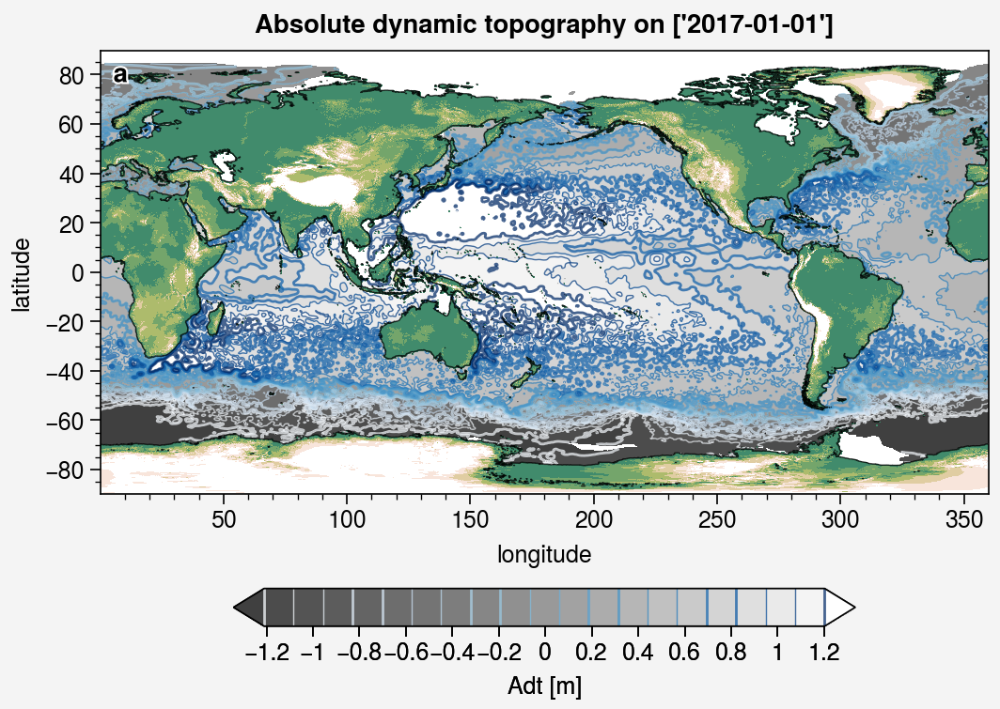

In [23]:
plot_ssh(ds_duacs_dt2021_selection.adt)

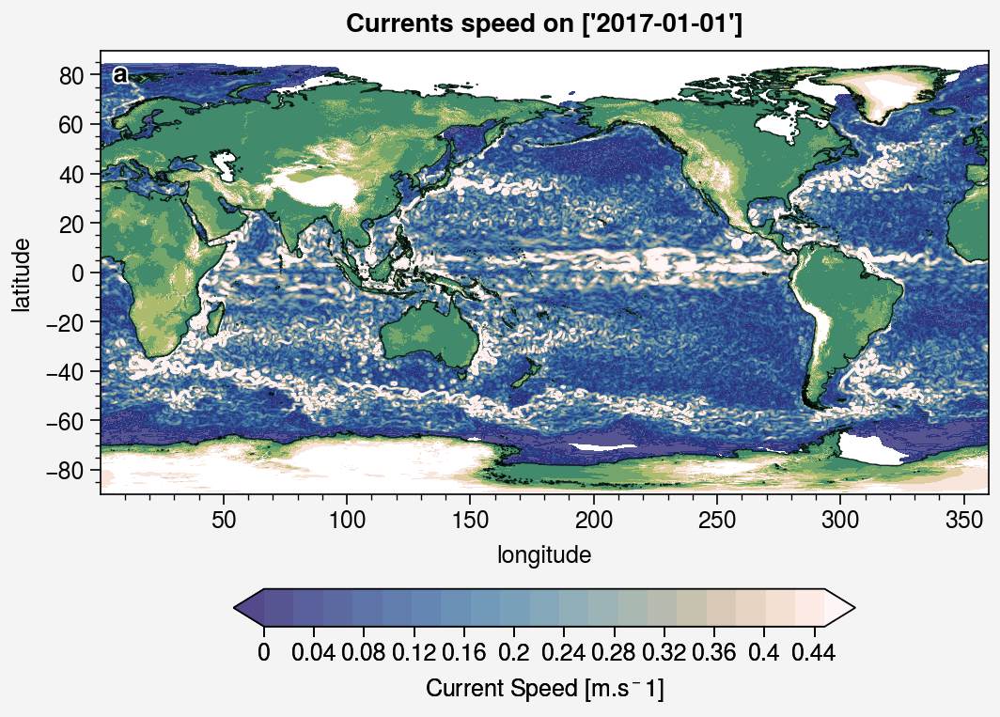

In [24]:
plot_currents(ds_duacs_dt2021_selection.ugos, ds_duacs_dt2021_selection.vgos)

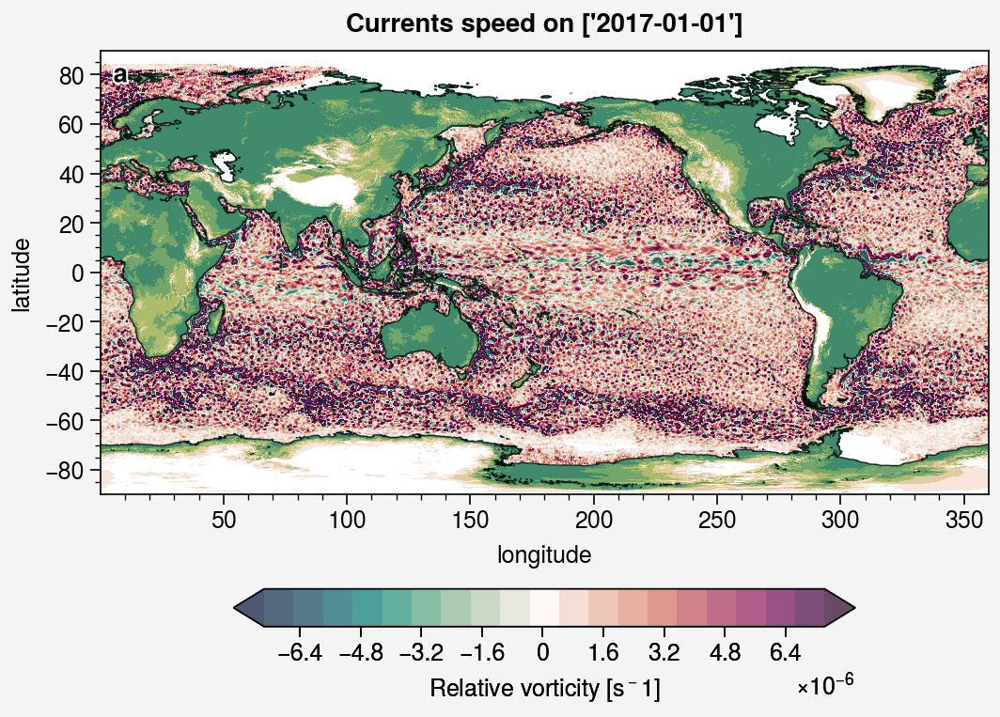

In [25]:
plot_vorticity(ds_duacs_dt2021_selection.ugos, ds_duacs_dt2021_selection.vgos)